# 10C — Analisis Kesalahan Model Menggunakan Grad-CAM

Notebook ini menggunakan Gradient-weighted Class Activation Mapping atau Grad-CAM untuk menjelaskan bagian citra yang memengaruhi prediksi ResNet50.

Checkpoint yang digunakan:

```text
models/resnet50_gcd_reference_tl_best.pth


## 1. Interpretasi Grad-CAM

Grad-CAM menggunakan gradient dari skor suatu kelas terhadap feature map pada lapisan konvolusi terakhir.

Secara umum:

- warna merah menunjukkan wilayah dengan kontribusi relatif lebih tinggi;
- warna kuning menunjukkan kontribusi menengah;
- warna biru menunjukkan kontribusi lebih rendah.

Heatmap Grad-CAM bukan segmentasi objek dan bukan bukti hubungan sebab-akibat. Grad-CAM hanya menunjukkan lokasi yang memiliki pengaruh relatif terhadap skor kelas tertentu.

Hasil yang diharapkan adalah aktivasi pada bentuk, tekstur, ketebalan, dan distribusi awan. Jika aktivasi justru terkonsentrasi pada tepi citra, objek darat, watermark, atau latar belakang yang tidak relevan, model mungkin mempelajari shortcut visual.

In [50]:
from pathlib import Path  # Mengimpor Path untuk mengelola lokasi file.
from datetime import datetime  # Mengimpor datetime untuk membuat identitas analisis.
import json  # Mengimpor json untuk membaca dan menyimpan konfigurasi.
import random  # Mengimpor random untuk mengatur seed.
import re  # Mengimpor re untuk membersihkan nama file.
import sys  # Mengimpor sys untuk menampilkan versi Python.

import albumentations as A  # Mengimpor Albumentations untuk memuat transform evaluasi.
import matplotlib.pyplot as plt  # Mengimpor Matplotlib untuk heatmap dan visualisasi.
import numpy as np  # Mengimpor NumPy untuk pengolahan citra dan Grad-CAM.
import pandas as pd  # Mengimpor Pandas untuk membaca hasil prediksi.
import torch  # Mengimpor PyTorch sebagai framework model.
import torch.nn.functional as F  # Mengimpor fungsi interpolasi dan aktivasi PyTorch.
import timm  # Mengimpor timm untuk membentuk arsitektur ResNet50.

from IPython.display import display  # Mengimpor display untuk menampilkan tabel dan gambar.
from PIL import Image  # Mengimpor Image untuk membuka citra.
from timm.data import resolve_model_data_config  # Mengimpor fungsi pembaca konfigurasi normalisasi model.
from tqdm.auto import tqdm  # Mengimpor progress bar.

pd.set_option("display.max_columns", None)  # Menampilkan seluruh kolom DataFrame.
pd.set_option("display.max_colwidth", 150)  # Mengatur lebar kolom DataFrame.

print(f"Python          : {sys.version.split()[0]}")  # Menampilkan versi Python.
print(f"PyTorch         : {torch.__version__}")  # Menampilkan versi PyTorch.
print(f"timm            : {timm.__version__}")  # Menampilkan versi timm.
print(f"Albumentations  : {A.__version__}")  # Menampilkan versi Albumentations.
print(f"CUDA tersedia   : {torch.cuda.is_available()}")  # Menampilkan status CUDA.

Python          : 3.11.9
PyTorch         : 2.11.0+cu128
timm            : 1.0.28
Albumentations  : 2.0.8
CUDA tersedia   : True


## 2. Menentukan Lokasi Project dan Artefak

Notebook membaca:

- checkpoint terbaik ResNet50;
- konfigurasi model;
- transform evaluasi;
- ringkasan validation terbaru;
- CSV seluruh prediksi validation.

Notebook tidak menjalankan inferensi ulang pada seluruh validation set. Prediksi yang telah tersimpan digunakan untuk memilih citra Grad-CAM.

Model hanya dijalankan kembali pada citra terpilih karena Grad-CAM membutuhkan forward pass dan backward pass terhadap skor kelas.

In [51]:
CURRENT_DIR = Path.cwd().resolve()  # Mengambil working directory aktif.

if CURRENT_DIR.name == "notebooks":  # Memeriksa apakah notebook dijalankan dari folder notebooks.
    PROJECT_DIR = CURRENT_DIR.parent  # Menggunakan parent notebooks sebagai root project.
else:  # Menangani eksekusi dari root project.
    PROJECT_DIR = CURRENT_DIR  # Menggunakan working directory sebagai root project.

PROCESSED_DIR = PROJECT_DIR / "dataset" / "processed"  # Menentukan lokasi metadata preprocessing.
MODELS_DIR = PROJECT_DIR / "models"  # Menentukan lokasi checkpoint.
LOGS_DIR = PROJECT_DIR / "logs"  # Menentukan lokasi log.

MODEL_CONFIG_PATH = PROCESSED_DIR / "model_config.json"  # Menentukan lokasi konfigurasi model.
EVAL_TRANSFORM_PATH = PROCESSED_DIR / "eval_transform.json"  # Menentukan lokasi transform evaluasi.
BEST_CHECKPOINT_PATH = MODELS_DIR / "resnet50_gcd_reference_tl_best.pth"  # Menentukan checkpoint terbaik.

validation_summary_candidates = list(  # Mencari ringkasan validation.
    LOGS_DIR.glob("resnet50_reference_tl_validation_*/validation_summary.json")  # Menggunakan pola folder validation.
)  # Menutup pencarian ringkasan.

if not validation_summary_candidates:  # Memeriksa ketersediaan ringkasan validation.
    raise FileNotFoundError(  # Menghentikan notebook jika ringkasan tidak tersedia.
        "Ringkasan validation tidak ditemukan. "  # Menjelaskan sumber kesalahan.
        "Jalankan 09b_validasi_model_reference_tl.ipynb terlebih dahulu."  # Memberikan tindakan perbaikan.
    )  # Menutup FileNotFoundError.

VALIDATION_SUMMARY_PATH = max(  # Memilih ringkasan validation terbaru.
    validation_summary_candidates,  # Memberikan daftar kandidat.
    key=lambda path: path.stat().st_mtime,  # Membandingkan waktu modifikasi.
)  # Menutup pemilihan ringkasan.

with VALIDATION_SUMMARY_PATH.open("r", encoding="utf-8") as file:  # Membuka ringkasan validation.
    validation_summary = json.load(file)  # Membaca ringkasan validation.

PREDICTIONS_PATH = PROJECT_DIR / validation_summary["output_artifacts"]["predictions"]  # Mengambil lokasi CSV prediksi.

required_paths = [  # Membentuk daftar artefak wajib.
    MODEL_CONFIG_PATH,  # Memasukkan konfigurasi model.
    EVAL_TRANSFORM_PATH,  # Memasukkan transform evaluasi.
    BEST_CHECKPOINT_PATH,  # Memasukkan checkpoint.
    VALIDATION_SUMMARY_PATH,  # Memasukkan ringkasan validation.
    PREDICTIONS_PATH,  # Memasukkan CSV prediksi.
]  # Menutup daftar artefak.

missing_paths = [path for path in required_paths if not path.exists()]  # Mencari artefak yang tidak tersedia.

if missing_paths:  # Memeriksa keberadaan artefak yang hilang.
    missing_text = "\n".join(f"- {path}" for path in missing_paths)  # Menyusun daftar artefak.
    raise FileNotFoundError(f"Artefak Grad-CAM belum lengkap:\n{missing_text}")  # Menghentikan notebook.

with MODEL_CONFIG_PATH.open("r", encoding="utf-8") as file:  # Membuka konfigurasi model.
    model_config = json.load(file)  # Membaca konfigurasi model.

predictions_df = pd.read_csv(PREDICTIONS_PATH)  # Membaca seluruh prediksi validation.

if predictions_df["is_correct"].dtype == object:  # Memeriksa apakah status prediksi dibaca sebagai teks.
    predictions_df["is_correct"] = predictions_df["is_correct"].map({"True": True, "False": False})  # Mengubah teks menjadi Boolean.

RUN_ID = datetime.now().astimezone().strftime("%Y%m%d_%H%M%S")  # Membuat identitas waktu analisis.
GRADCAM_TAG = "reference_tl_gradcam_validation"  # Menentukan identitas analisis Grad-CAM.
RUN_LOG_DIR = LOGS_DIR / f"resnet50_{GRADCAM_TAG}_{RUN_ID}"  # Menentukan folder output.
GRADCAM_IMAGES_DIR = RUN_LOG_DIR / "gradcam_images"  # Menentukan folder gambar Grad-CAM.
RUN_LOG_DIR.mkdir(parents=True, exist_ok=True)  # Membuat folder log.
GRADCAM_IMAGES_DIR.mkdir(parents=True, exist_ok=True)  # Membuat folder gambar.

SELECTED_SAMPLES_PATH = RUN_LOG_DIR / "gradcam_selected_samples.csv"  # Menentukan lokasi daftar sampel.
GRADCAM_MANIFEST_PATH = RUN_LOG_DIR / "gradcam_manifest.csv"  # Menentukan lokasi manifest.
GRADCAM_SUMMARY_PATH = RUN_LOG_DIR / "gradcam_summary.json"  # Menentukan lokasi ringkasan.

print(f"Ringkasan validation : {VALIDATION_SUMMARY_PATH.relative_to(PROJECT_DIR)}")  # Menampilkan ringkasan validation.
print(f"Predictions CSV      : {PREDICTIONS_PATH.relative_to(PROJECT_DIR)}")  # Menampilkan CSV prediksi.
print(f"Checkpoint           : {BEST_CHECKPOINT_PATH.relative_to(PROJECT_DIR)}")  # Menampilkan checkpoint.
print(f"Output Grad-CAM      : {RUN_LOG_DIR.relative_to(PROJECT_DIR)}")  # Menampilkan folder output.
print("Test set digunakan  : Tidak")  # Menegaskan test set tidak digunakan.

Ringkasan validation : logs\resnet50_reference_tl_validation_20260828_131749\validation_summary.json
Predictions CSV      : logs\resnet50_reference_tl_validation_20260828_131749\validation_predictions.csv
Checkpoint           : models\resnet50_gcd_reference_tl_best.pth
Output Grad-CAM      : logs\resnet50_reference_tl_gradcam_validation_20260828_192812
Test set digunakan  : Tidak


## 3. Memeriksa Hasil Validation

CSV prediksi harus memiliki informasi:

- lokasi citra;
- kelas aktual;
- kelas prediksi;
- confidence;
- entropy;
- status prediksi benar atau salah.

Jumlah prediksi salah harus konsisten dengan hasil validation sebelumnya, yaitu 155 citra.

In [52]:
required_prediction_columns = {  # Menentukan kolom prediksi yang wajib tersedia.
    "image_path",  # Mewajibkan lokasi citra.
    "true_class_id",  # Mewajibkan indeks kelas aktual.
    "true_class_name",  # Mewajibkan nama kelas aktual.
    "predicted_class_id",  # Mewajibkan indeks prediksi.
    "predicted_class_name",  # Mewajibkan nama kelas prediksi.
    "confidence",  # Mewajibkan confidence.
    "entropy",  # Mewajibkan entropy.
    "is_correct",  # Mewajibkan status prediksi.
}  # Menutup daftar kolom wajib.

missing_prediction_columns = required_prediction_columns - set(predictions_df.columns)  # Mencari kolom yang hilang.

if missing_prediction_columns:  # Memeriksa kelengkapan kolom.
    raise KeyError(f"Kolom prediksi belum lengkap: {sorted(missing_prediction_columns)}")  # Menghentikan proses.

misclassified_df = predictions_df.loc[~predictions_df["is_correct"]].copy()  # Mengambil prediksi salah.
correct_df = predictions_df.loc[predictions_df["is_correct"]].copy()  # Mengambil prediksi benar.

validation_samples = int(validation_summary["validation_samples"])  # Mengambil jumlah validation dari ringkasan.
expected_errors = int(validation_summary["misclassified_samples"])  # Mengambil jumlah kesalahan dari ringkasan.

if len(predictions_df) != validation_samples:  # Memeriksa jumlah prediksi.
    raise ValueError("Jumlah prediksi berbeda dari ringkasan validation.")  # Menghentikan proses jika tidak konsisten.

if len(misclassified_df) != expected_errors:  # Memeriksa jumlah kesalahan.
    raise ValueError("Jumlah kesalahan berbeda dari ringkasan validation.")  # Menghentikan proses jika tidak konsisten.

validation_check_table = pd.DataFrame({  # Membentuk tabel pemeriksaan.
    "Kelompok": ["Seluruh validation", "Prediksi benar", "Prediksi salah"],  # Menentukan kelompok.
    "Jumlah": [len(predictions_df), len(correct_df), len(misclassified_df)],  # Menentukan jumlah.
})  # Menutup pembuatan tabel.

display(validation_check_table)  # Menampilkan tabel pemeriksaan.
display(misclassified_df.head(10))  # Menampilkan sepuluh kesalahan confidence tertinggi.

,Kelompok,Jumlah
0,Seluruh validation,1969
1,Prediksi benar,1814
2,Prediksi salah,155


,image_path,true_class_id,true_class_name,predicted_class_id,predicted_class_name,confidence,entropy,is_correct,probability_1_cumulus,probability_2_altocumulus,probability_3_cirrus,probability_4_clearsky,probability_5_stratocumulus,probability_6_cumulonimbus,probability_7_mixed
215,dataset\source\val\2_altocumulus\2_altocumulus_000354.jpg,1,2_altocumulus,2,3_cirrus,0.510932,1.256661,False,0.119126,0.139001,0.510932,0.002764,0.005432,0.001057,0.221689
216,dataset\source\val\2_altocumulus\2_altocumulus_000357.jpg,1,2_altocumulus,6,7_mixed,0.485489,1.409658,False,0.059620,0.235341,0.062971,0.129334,0.021933,0.005312,0.485489
223,dataset\source\val\2_altocumulus\2_altocumulus_000399.jpg,1,2_altocumulus,0,1_cumulus,0.460649,1.451486,False,0.460649,0.212866,0.036954,0.154373,0.031424,0.002294,0.101439
224,dataset\source\val\2_altocumulus\2_altocumulus_000401.jpg,1,2_altocumulus,5,6_cumulonimbus,0.284123,1.649176,False,0.105394,0.235661,0.037948,0.013798,0.255558,0.284123,0.067518
239,dataset\source\val\2_altocumulus\2_altocumulus_000457.jpg,1,2_altocumulus,2,3_cirrus,0.785404,0.783401,False,0.114370,0.048903,0.785404,0.008481,0.006528,0.000952,0.035361
306,dataset\source\val\3_cirrus\3_cirrus_000024.jpg,2,3_cirrus,4,5_stratocumulus,0.451482,1.384626,False,0.031823,0.039993,0.326702,0.082785,0.451482,0.013660,0.053554
310,dataset\source\val\3_cirrus\3_cirrus_000046.jpg,2,3_cirrus,4,5_stratocumulus,0.385803,1.461354,False,0.039087,0.042719,0.082504,0.010009,0.385803,0.352481,0.087397
359,dataset\source\val\3_cirrus\3_cirrus_000266.jpg,2,3_cirrus,3,4_clearsky,0.683642,1.151015,False,0.035705,0.038306,0.107012,0.683642,0.051395,0.021154,0.062786
380,dataset\source\val\3_cirrus\3_cirrus_000414.jpg,2,3_cirrus,5,6_cumulonimbus,0.297258,1.666986,False,0.029090,0.077317,0.208943,0.013475,0.222093,0.297258,0.151824
447,dataset\source\val\3_cirrus\3_cirrus_000753.jpg,2,3_cirrus,6,7_mixed,0.564527,1.101855,False,0.054501,0.013915,0.315860,0.005386,0.032481,0.013330,0.564527


## 4. Memilih Sampel Grad-CAM

Sampel dipilih secara deterministik berdasarkan hasil validation.

Empat kelompok digunakan:

| Kelompok | Kriteria |
|---|---|
| `stratocumulus_to_cumulonimbus` | Stratocumulus diprediksi sebagai cumulonimbus |
| `cumulonimbus_to_stratocumulus` | Cumulonimbus diprediksi sebagai stratocumulus |
| `other_high_confidence_errors` | Kesalahan lain dengan confidence tertinggi |
| `correct_high_confidence_controls` | Satu prediksi benar terbaik dari setiap kelas |

Lima citra dipilih dari setiap kelompok kesalahan utama. Prediksi benar digunakan sebagai kontrol untuk membandingkan pola perhatian model pada keputusan yang benar dan salah.

In [53]:
SAMPLES_PER_ERROR_GROUP = 5  # Menentukan jumlah sampel setiap kelompok kesalahan.

sc_to_cb = misclassified_df.loc[  # Memilih kesalahan stratocumulus menjadi cumulonimbus.
    (misclassified_df["true_class_name"] == "5_stratocumulus")  # Memilih label aktual stratocumulus.
    & (misclassified_df["predicted_class_name"] == "6_cumulonimbus")  # Memilih prediksi cumulonimbus.
].nlargest(SAMPLES_PER_ERROR_GROUP, "confidence").copy()  # Mengambil confidence tertinggi.

sc_to_cb["selection_group"] = "stratocumulus_to_cumulonimbus"  # Memberikan nama kelompok.

cb_to_sc = misclassified_df.loc[  # Memilih kesalahan cumulonimbus menjadi stratocumulus.
    (misclassified_df["true_class_name"] == "6_cumulonimbus")  # Memilih label aktual cumulonimbus.
    & (misclassified_df["predicted_class_name"] == "5_stratocumulus")  # Memilih prediksi stratocumulus.
].nlargest(SAMPLES_PER_ERROR_GROUP, "confidence").copy()  # Mengambil confidence tertinggi.

cb_to_sc["selection_group"] = "cumulonimbus_to_stratocumulus"  # Memberikan nama kelompok.

main_pair_mask = (  # Membentuk mask pasangan kesalahan utama.
    (  # Membuka kondisi pertama.
        (misclassified_df["true_class_name"] == "5_stratocumulus")  # Memilih stratocumulus aktual.
        & (misclassified_df["predicted_class_name"] == "6_cumulonimbus")  # Memilih cumulonimbus prediksi.
    )  # Menutup kondisi pertama.
    | (  # Menggabungkan dengan kondisi kedua.
        (misclassified_df["true_class_name"] == "6_cumulonimbus")  # Memilih cumulonimbus aktual.
        & (misclassified_df["predicted_class_name"] == "5_stratocumulus")  # Memilih stratocumulus prediksi.
    )  # Menutup kondisi kedua.
)  # Menutup mask.

other_errors = misclassified_df.loc[~main_pair_mask].nlargest(  # Memilih kesalahan di luar pasangan utama.
    SAMPLES_PER_ERROR_GROUP,  # Menentukan jumlah sampel.
    "confidence",  # Mengurutkan berdasarkan confidence.
).copy()  # Menyalin hasil.

other_errors["selection_group"] = "other_high_confidence_errors"  # Memberikan nama kelompok.

correct_controls = correct_df.sort_values(  # Mengurutkan prediksi benar.
    "confidence",  # Menggunakan confidence.
    ascending=False,  # Mengurutkan dari tertinggi.
).groupby(  # Mengelompokkan berdasarkan kelas aktual.
    "true_class_name",  # Menggunakan nama kelas aktual.
    sort=False,  # Mempertahankan urutan.
).head(1).copy()  # Mengambil satu kontrol setiap kelas.

correct_controls["selection_group"] = "correct_high_confidence_controls"  # Memberikan nama kelompok kontrol.

selected_samples_df = pd.concat(  # Menggabungkan seluruh kelompok.
    [sc_to_cb, cb_to_sc, other_errors, correct_controls],  # Memberikan DataFrame kelompok.
    ignore_index=True,  # Membentuk ulang indeks.
)  # Menutup penggabungan.

selected_samples_df = selected_samples_df.drop_duplicates(  # Menghapus citra ganda.
    subset=["image_path"],  # Menggunakan lokasi citra sebagai identitas.
    keep="first",  # Mempertahankan kemunculan pertama.
).reset_index(drop=True)  # Membentuk ulang indeks.

selected_samples_df.insert(0, "sample_id", range(1, len(selected_samples_df) + 1))  # Menambahkan ID sampel.
selected_samples_df.to_csv(SELECTED_SAMPLES_PATH, index=False, encoding="utf-8")  # Menyimpan daftar sampel.

selection_summary = selected_samples_df.groupby(  # Mengelompokkan sampel.
    "selection_group",  # Menggunakan nama kelompok.
).size().reset_index(name="jumlah")  # Menghitung jumlah setiap kelompok.

display(selection_summary)  # Menampilkan jumlah sampel setiap kelompok.
display(selected_samples_df[  # Menampilkan sampel terpilih.
    [  # Membentuk daftar kolom tampilan.
        "sample_id",  # Menampilkan ID sampel.
        "selection_group",  # Menampilkan kelompok.
        "true_class_name",  # Menampilkan kelas aktual.
        "predicted_class_name",  # Menampilkan prediksi.
        "confidence",  # Menampilkan confidence.
        "entropy",  # Menampilkan entropy.
        "image_path",  # Menampilkan lokasi citra.
    ]  # Menutup daftar kolom.
])  # Menutup tampilan sampel.

,selection_group,jumlah
0,correct_high_confidence_controls,7
1,cumulonimbus_to_stratocumulus,5
2,other_high_confidence_errors,5
3,stratocumulus_to_cumulonimbus,5


,sample_id,selection_group,true_class_name,predicted_class_name,confidence,entropy,image_path
0,1,stratocumulus_to_cumulonimbus,5_stratocumulus,6_cumulonimbus,0.792822,0.842125,dataset\source\val\5_stratocumulus\5_stratocumulus_001272.jpg
1,2,stratocumulus_to_cumulonimbus,5_stratocumulus,6_cumulonimbus,0.775659,0.914250,dataset\source\val\5_stratocumulus\5_stratocumulus_000362.jpg
2,3,stratocumulus_to_cumulonimbus,5_stratocumulus,6_cumulonimbus,0.745739,0.915822,dataset\source\val\5_stratocumulus\5_stratocumulus_001670.jpg
3,4,stratocumulus_to_cumulonimbus,5_stratocumulus,6_cumulonimbus,0.731337,1.025462,dataset\source\val\5_stratocumulus\5_stratocumulus_000636.jpg
4,5,stratocumulus_to_cumulonimbus,5_stratocumulus,6_cumulonimbus,0.731163,1.025168,dataset\source\val\5_stratocumulus\5_stratocumulus_001271.jpg
5,6,cumulonimbus_to_stratocumulus,6_cumulonimbus,5_stratocumulus,0.800524,0.840710,dataset\source\val\6_cumulonimbus\6_cumulonimbus_002189.jpg
6,7,cumulonimbus_to_stratocumulus,6_cumulonimbus,5_stratocumulus,0.797658,0.834309,dataset\source\val\6_cumulonimbus\6_cumulonimbus_000532.jpg
7,8,cumulonimbus_to_stratocumulus,6_cumulonimbus,5_stratocumulus,0.778201,0.871939,dataset\source\val\6_cumulonimbus\6_cumulonimbus_000190.jpg
8,9,cumulonimbus_to_stratocumulus,6_cumulonimbus,5_stratocumulus,0.726194,0.980403,dataset\source\val\6_cumulonimbus\6_cumulonimbus_000391.jpg
9,10,cumulonimbus_to_stratocumulus,6_cumulonimbus,5_stratocumulus,0.708205,1.092544,dataset\source\val\6_cumulonimbus\6_cumulonimbus_000337.jpg


## 5. Memuat Model dan Menentukan Target Layer

Model dibuat menggunakan `pretrained=False` karena seluruh parameter sudah tersedia dalam checkpoint.

Target Grad-CAM adalah blok terakhir pada `layer4` ResNet50:

```python
model.layer4[-1]

In [54]:
def seed_everything(seed: int) -> None:  # Mendefinisikan fungsi pengaturan seed.
    random.seed(seed)  # Mengatur seed Python.
    np.random.seed(seed)  # Mengatur seed NumPy.
    torch.manual_seed(seed)  # Mengatur seed PyTorch.

    if torch.cuda.is_available():  # Memeriksa CUDA.
        torch.cuda.manual_seed_all(seed)  # Mengatur seed seluruh GPU.

def load_own_checkpoint(checkpoint_path: Path) -> dict:  # Mendefinisikan pemuatan checkpoint lokal.
    try:  # Mencoba antarmuka PyTorch terbaru.
        return torch.load(checkpoint_path, map_location="cpu", weights_only=False)  # Memuat checkpoint tepercaya.
    except TypeError:  # Menangani antarmuka PyTorch lama.
        return torch.load(checkpoint_path, map_location="cpu")  # Memuat checkpoint tanpa weights_only.

SEED = int(model_config.get("seed", 42))  # Mengambil seed konfigurasi.
seed_everything(SEED)  # Menjalankan pengaturan seed.

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Memilih device.
checkpoint = load_own_checkpoint(BEST_CHECKPOINT_PATH)  # Memuat checkpoint.

if checkpoint.get("test_data_used") is not False:  # Memeriksa penggunaan test pada checkpoint.
    raise ValueError("Checkpoint menunjukkan test set pernah digunakan.")  # Menghentikan proses jika test pernah digunakan.

MODEL_NAME = str(checkpoint["model_name"])  # Mengambil nama model.
CLASS_TO_IDX = {str(name): int(index) for name, index in checkpoint["class_to_idx"].items()}  # Mengambil mapping kelas.
IDX_TO_CLASS = {index: name for name, index in CLASS_TO_IDX.items()}  # Membalik mapping kelas.
NUM_CLASSES = len(CLASS_TO_IDX)  # Menghitung jumlah kelas.
INPUT_CHANNELS = int(checkpoint["input_shape"][0])  # Mengambil jumlah channel.
DROPOUT_RATE = float(checkpoint.get("dropout_rate", 0.0))  # Mengambil dropout.

model = timm.create_model(  # Membentuk arsitektur model.
    MODEL_NAME,  # Menggunakan nama model checkpoint.
    pretrained=False,  # Tidak mengunduh bobot pretrained.
    num_classes=NUM_CLASSES,  # Menentukan jumlah kelas.
    in_chans=INPUT_CHANNELS,  # Menentukan jumlah channel.
    drop_rate=DROPOUT_RATE,  # Menggunakan dropout checkpoint.
)  # Menutup pembentukan model.

model.load_state_dict(checkpoint["model_state_dict"], strict=True)  # Memuat seluruh parameter.
model = model.to(DEVICE)  # Memindahkan model ke device.
model.eval()  # Mengaktifkan mode evaluasi.

if not hasattr(model, "layer4"):  # Memeriksa keberadaan layer4.
    raise AttributeError("Model tidak memiliki layer4 untuk target Grad-CAM.")  # Menghentikan proses jika target tidak tersedia.

TARGET_LAYER = model.layer4[-1].conv3  # Memilih blok terakhir layer4.
TARGET_LAYER_NAME = "layer4[-1].conv3 "  # Menyimpan nama target layer.

data_config = resolve_model_data_config(model)  # Mengambil konfigurasi input model.
NORMALIZATION_MEAN = np.asarray(data_config["mean"], dtype=np.float32).reshape(3, 1, 1)  # Mengambil mean normalisasi.
NORMALIZATION_STD = np.asarray(data_config["std"], dtype=np.float32).reshape(3, 1, 1)  # Mengambil standard deviation.

print(f"Model                : {MODEL_NAME}")  # Menampilkan nama model.
print(f"Checkpoint epoch     : {checkpoint.get('global_epoch')}")  # Menampilkan epoch checkpoint.
print(f"Target Grad-CAM      : {TARGET_LAYER_NAME}")  # Menampilkan target layer.
print(f"Target layer object  : {TARGET_LAYER}")  # Menampilkan objek target layer.
print(f"Device               : {DEVICE}")  # Menampilkan device.
print("Test set digunakan  : Tidak")  # Menegaskan test tidak digunakan.

Model                : resnet50
Checkpoint epoch     : 21
Target Grad-CAM      : layer4[-1].conv3 
Target layer object  : Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
Device               : cuda
Test set digunakan  : Tidak


## 6. Menyiapkan Transform Citra

Transform yang digunakan harus sama dengan transform validation. Input tensor yang telah dinormalisasi diberikan kepada model.

Untuk visualisasi, tensor dikembalikan ke rentang warna RGB menggunakan mean dan standard deviation dari konfigurasi pretrained model. Dengan demikian, citra yang ditampilkan sesuai dengan citra yang benar-benar diterima model setelah resize dan preprocessing.

In [55]:
class AlbumentationsImageTransform:  # Mendefinisikan adapter transform.
    def __init__(self, pipeline):  # Mendefinisikan konstruktor.
        self.pipeline = pipeline  # Menyimpan pipeline Albumentations.

    def __call__(self, image):  # Mendefinisikan proses transform.
        image_array = np.asarray(image.convert("RGB"))  # Mengubah citra PIL menjadi array RGB.
        transformed = self.pipeline(image=image_array)["image"]  # Menjalankan transform.

        if isinstance(transformed, np.ndarray):  # Memeriksa output NumPy.
            transformed = np.ascontiguousarray(transformed.transpose(2, 0, 1))  # Mengubah HWC menjadi CHW.
            transformed = torch.from_numpy(transformed)  # Mengubah array menjadi tensor.

        if transformed.dtype == torch.uint8:  # Memeriksa tipe uint8.
            transformed = transformed.float() / 255.0  # Mengubah ke float.
        else:  # Menangani tensor yang telah dinormalisasi.
            transformed = transformed.float()  # Memastikan tipe float32.

        return transformed  # Mengembalikan tensor.

eval_pipeline = A.load(str(EVAL_TRANSFORM_PATH), data_format="json")  # Memuat transform evaluasi.

if hasattr(eval_pipeline, "set_random_seed"):  # Memeriksa dukungan seed.
    eval_pipeline.set_random_seed(SEED)  # Mengatur seed transform.

eval_transform = AlbumentationsImageTransform(eval_pipeline)  # Membungkus transform evaluasi.

def denormalize_tensor(input_tensor: torch.Tensor) -> np.ndarray:  # Mendefinisikan fungsi denormalisasi.
    image_array = input_tensor.detach().cpu().squeeze(0).numpy()  # Mengubah tensor batch menjadi array CHW.
    image_array = image_array * NORMALIZATION_STD + NORMALIZATION_MEAN  # Mengembalikan normalisasi.
    image_array = np.clip(image_array, 0.0, 1.0)  # Membatasi rentang nol sampai satu.
    image_array = image_array.transpose(1, 2, 0)  # Mengubah CHW menjadi HWC.
    return image_array  # Mengembalikan citra RGB.

class AlbumentationsImageTransform:  # Mendefinisikan adapter transform.
    def __init__(self, pipeline):  # Mendefinisikan konstruktor.
        self.pipeline = pipeline  # Menyimpan pipeline Albumentations.

    def __call__(self, image):  # Mendefinisikan proses transform.
        image_array = np.asarray(image.convert("RGB"))  # Mengubah citra PIL menjadi array RGB.
        transformed = self.pipeline(image=image_array)["image"]  # Menjalankan transform.

        if isinstance(transformed, np.ndarray):  # Memeriksa output NumPy.
            transformed = np.ascontiguousarray(transformed.transpose(2, 0, 1))  # Mengubah HWC menjadi CHW.
            transformed = torch.from_numpy(transformed)  # Mengubah array menjadi tensor.

        if transformed.dtype == torch.uint8:  # Memeriksa tipe uint8.
            transformed = transformed.float() / 255.0  # Mengubah ke float.
        else:  # Menangani tensor yang telah dinormalisasi.
            transformed = transformed.float()  # Memastikan tipe float32.

        return transformed  # Mengembalikan tensor.

eval_pipeline = A.load(str(EVAL_TRANSFORM_PATH), data_format="json")  # Memuat transform evaluasi.

if hasattr(eval_pipeline, "set_random_seed"):  # Memeriksa dukungan seed.
    eval_pipeline.set_random_seed(SEED)  # Mengatur seed transform.

eval_transform = AlbumentationsImageTransform(eval_pipeline)  # Membungkus transform evaluasi.

def denormalize_tensor(input_tensor: torch.Tensor) -> np.ndarray:  # Mendefinisikan fungsi denormalisasi.
    image_array = input_tensor.detach().cpu().squeeze(0).numpy()  # Mengubah tensor batch menjadi array CHW.
    image_array = image_array * NORMALIZATION_STD + NORMALIZATION_MEAN  # Mengembalikan normalisasi.
    image_array = np.clip(image_array, 0.0, 1.0)  # Membatasi rentang nol sampai satu.
    image_array = image_array.transpose(1, 2, 0)  # Mengubah CHW menjadi HWC.
    return image_array  # Mengembalikan citra RGB.

In [56]:
class GradCAM:  # Mendefinisikan implementasi Grad-CAM.
    def __init__(self, model, target_layer):  # Mendefinisikan konstruktor.
        self.model = model  # Menyimpan model yang akan dianalisis.
        self.target_layer = target_layer  # Menyimpan target layer Grad-CAM.
        self.activations = None  # Menyiapkan penyimpanan activation.
        
        self.hook = self.target_layer.register_forward_hook(  # Memasang forward hook.
            self._save_activation  # Menentukan fungsi penerima activation.
        )  # Menutup pemasangan hook.

    def _save_activation(
        self,
        module,
        module_input,
        module_output,
    ):  # Mendefinisikan fungsi forward hook.
        self.activations = module_output  # Menyimpan output target layer dari forward pass terbaru.

    def generate(
        self,
        input_tensor: torch.Tensor,
        target_class_id: int,
    ):  # Mendefinisikan fungsi pembuatan Grad-CAM.
        if self.hook is None:  # Memeriksa apakah hook masih aktif.
            raise RuntimeError(  # Menghentikan proses jika hook sudah dilepaskan.
                "Hook Grad-CAM sudah ditutup. Buat ulang objek GradCAM."
            )  # Menutup pesan error.

        self.activations = None  # Menghapus activation lama sebelum forward pass baru.
        self.model.zero_grad(set_to_none=True)  # Membersihkan gradient model sebelumnya.

        with torch.enable_grad():  # Memastikan autograd aktif selama pembuatan Grad-CAM.
            logits = self.model(input_tensor)  # Menjalankan forward pass terbaru.

            if self.activations is None:  # Memeriksa apakah hook menangkap activation.
                raise RuntimeError(  # Menghentikan proses jika target layer tidak aktif.
                    "Activation target layer tidak tertangkap pada forward pass terbaru."
                )  # Menutup pesan error.

            probabilities = torch.softmax(  # Menghitung probabilitas seluruh kelas.
                logits.float(),  # Menggunakan logits tipe float.
                dim=1,  # Menghitung softmax pada dimensi kelas.
            )  # Menutup perhitungan probabilitas.

            target_score = logits[  # Mengambil skor kelas yang akan dijelaskan.
                :,
                target_class_id,
            ].sum()  # Menjumlahkan skor kelas target dalam batch.

            gradients = torch.autograd.grad(  # Menghitung gradient kelas terhadap activation.
                outputs=target_score,  # Menentukan skor kelas sebagai output.
                inputs=self.activations,  # Menentukan activation sebagai input diferensiasi.
                retain_graph=False,  # Tidak mempertahankan graph setelah gradient dihitung.
                create_graph=False,  # Tidak membentuk graph turunan lanjutan.
                allow_unused=False,  # Memastikan activation harus terhubung dengan skor.
            )[0]  # Mengambil tensor gradient pertama.

        activation_values = self.activations.detach()  # Memisahkan activation dari graph.
        gradient_values = gradients.detach()  # Memisahkan gradient dari graph.

        weights = gradient_values.mean(  # Menghitung bobot setiap channel.
            dim=(2, 3),  # Merata-ratakan dimensi spasial.
            keepdim=True,  # Mempertahankan dimensi untuk broadcasting.
        )  # Menutup perhitungan bobot.

        cam = (  # Menghitung kombinasi activation berbobot.
            weights * activation_values  # Mengalikan activation dengan bobot channel.
        ).sum(  # Menjumlahkan seluruh channel.
            dim=1,  # Menjumlahkan pada dimensi channel.
            keepdim=True,  # Mempertahankan satu dimensi channel.
        )  # Menutup pembentukan CAM.

        cam = F.relu(cam)  # Mempertahankan kontribusi positif terhadap kelas target.

        cam = F.interpolate(  # Memperbesar heatmap sesuai ukuran input.
            cam,  # Memberikan heatmap awal.
            size=input_tensor.shape[-2:],  # Menggunakan tinggi dan lebar input.
            mode="bilinear",  # Menggunakan interpolasi bilinear.
            align_corners=False,  # Menonaktifkan penyelarasan sudut.
        )  # Menutup interpolasi.

        cam = cam.squeeze(0).squeeze(0)  # Menghapus dimensi batch dan channel.
        cam_min = cam.min()  # Mengambil intensitas minimum.
        cam_max = cam.max()  # Mengambil intensitas maksimum.

        cam = (  # Menormalisasi heatmap.
            cam - cam_min  # Menggeser nilai minimum menjadi nol.
        ) / (  # Membuka operasi pembagian.
            cam_max - cam_min + 1e-12  # Mencegah pembagian dengan nol.
        )  # Menutup normalisasi.

        cam_array = cam.cpu().numpy()  # Mengubah heatmap menjadi array NumPy.
        
        probability_array = (  # Menyiapkan probabilitas dalam bentuk NumPy.
            probabilities.detach().cpu().numpy()[0]  # Mengambil probabilitas sampel pertama.
        )  # Menutup konversi probabilitas.

        return cam_array, probability_array  # Mengembalikan heatmap dan probabilitas.

    def close(self):  # Mendefinisikan fungsi pelepasan hook.
        if self.hook is not None:  # Memeriksa apakah hook masih tersedia.
            self.hook.remove()  # Melepaskan hook dari target layer.
            self.hook = None  # Menandai bahwa hook sudah tidak aktif.

        self.activations = None  # Menghapus referensi activation dari memori.

In [57]:
OVERLAY_ALPHA = 0.45  # Menentukan kontribusi warna heatmap sebesar 45%.

def create_overlay(
    image_array: np.ndarray,
    cam_array: np.ndarray,
) -> np.ndarray:
    """Menggabungkan citra input dengan heatmap Grad-CAM."""

    colored_heatmap = plt.get_cmap("jet")(cam_array)[..., :3]  # Mengubah heatmap menjadi citra RGB.
    
    overlay = (  # Memulai penggabungan citra dan heatmap.
        (1.0 - OVERLAY_ALPHA) * image_array  # Memberikan bobot 55% kepada citra input.
        + OVERLAY_ALPHA * colored_heatmap  # Memberikan bobot 45% kepada heatmap.
    )  # Menutup penggabungan.
    
    overlay = np.clip(overlay, 0.0, 1.0)  # Membatasi nilai piksel pada rentang valid.
    
    return overlay  # Mengembalikan citra hasil overlay.


def safe_filename(text: str) -> str:
    """Membersihkan teks agar aman digunakan sebagai nama file."""

    safe_text = re.sub(  # Membersihkan karakter yang tidak aman.
        r"[^A-Za-z0-9_.-]+",  # Menentukan karakter yang diperbolehkan.
        "_",  # Mengganti karakter tidak aman dengan garis bawah.
        str(text),  # Mengubah masukan menjadi teks.
    )  # Menutup proses penggantian.
    
    return safe_text  # Mengembalikan nama file yang sudah dibersihkan.


print("Fungsi create_overlay dan safe_filename berhasil disiapkan.")

Fungsi create_overlay dan safe_filename berhasil disiapkan.


In [58]:
# Menghitung selisih rata-rata antara dua heatmap.
cam_mae = float(
    np.mean(
        np.abs(predicted_cam - true_cam)
    )
)

# Meratakan kedua heatmap menjadi vektor satu dimensi.
predicted_cam_flat = predicted_cam.ravel()

# Meratakan heatmap kelas sebenarnya menjadi vektor satu dimensi.
true_cam_flat = true_cam.ravel()

# Menghitung korelasi spasial kedua heatmap.
cam_correlation = float(
    np.corrcoef(
        predicted_cam_flat,
        true_cam_flat
    )[0, 1]
)

# Menampilkan perbedaan absolut kedua heatmap.
print(f"CAM mean absolute difference : {cam_mae:.6f}")

# Menampilkan korelasi spasial kedua heatmap.
print(f"CAM correlation             : {cam_correlation:.6f}")

# Memeriksa kemungkinan heatmap yang tidak class-specific.
if cam_correlation > 0.98 and cam_mae < 0.02:

    # Menampilkan peringatan jika kedua heatmap hampir identik.
    print(
        "PERINGATAN: CAM prediksi dan CAM label asli hampir identik."
    )

CAM mean absolute difference : 0.000000
CAM correlation             : 1.000000
PERINGATAN: CAM prediksi dan CAM label asli hampir identik.


## 9. Menghasilkan Visualisasi Grad-CAM

Setiap citra menghasilkan tiga panel:

1. citra input model;
2. Grad-CAM untuk kelas prediksi;
3. Grad-CAM untuk kelas aktual.

Pada prediksi benar, kelas aktual dan prediksi sama. Heatmap hanya dihitung sekali dan digunakan pada kedua panel.

Pada prediksi salah, kedua heatmap dihitung secara terpisah. Perbedaan lokasi aktivasi dapat menunjukkan mengapa model lebih memilih kelas yang salah.

In [59]:
manifest_records = []  # Mengosongkan manifest agar tidak memakai hasil eksekusi sebelumnya.

gradcam = GradCAM(  # Membuat objek Grad-CAM baru untuk eksekusi saat ini.
    model=model,  # Memberikan model ResNet50 yang telah dimuat.
    target_layer=TARGET_LAYER,  # Memberikan target layer terakhir ResNet50.
)  # Menutup pembuatan objek Grad-CAM.

try:  # Memulai proses dengan jaminan hook akan dilepaskan.
    for _, row in tqdm(  # Mengiterasi seluruh sampel terpilih.
        selected_samples_df.iterrows(),  # Mengambil setiap baris sampel.
        total=len(selected_samples_df),  # Menentukan jumlah keseluruhan sampel.
        desc="Membuat Grad-CAM",  # Menampilkan keterangan progress bar.
    ):  # Menutup konfigurasi iterasi.

        image_path = (  # Membentuk lokasi absolut citra untuk baris aktif.
            PROJECT_DIR / str(row["image_path"])
        )  # Menutup pembentukan lokasi citra.

        if not image_path.is_file():  # Memeriksa keberadaan citra baris aktif.
            raise FileNotFoundError(  # Menghentikan proses jika citra tidak tersedia.
                f"Citra tidak ditemukan: {image_path}"
            )  # Menutup pesan kesalahan.

        original_image = Image.open(  # Membuka citra pada baris aktif.
            image_path
        ).convert(  # Mengubah format warna citra.
            "RGB"
        )  # Memastikan citra memiliki tiga channel RGB.

        input_tensor = eval_transform(  # Menerapkan transform evaluasi.
            original_image
        ).unsqueeze(  # Menambahkan dimensi batch.
            0
        ).to(  # Memindahkan tensor ke perangkat model.
            DEVICE
        )  # Menutup pembentukan tensor input.

        true_class_id = int(  # Mengambil indeks kelas aktual.
            row["true_class_id"]
        )  # Menutup konversi indeks kelas aktual.

        predicted_class_id = int(  # Mengambil indeks kelas prediksi dari CSV.
            row["predicted_class_id"]
        )  # Menutup konversi indeks kelas prediksi.

        predicted_cam, probabilities = gradcam.generate(  # Menghasilkan Grad-CAM kelas prediksi.
            input_tensor=input_tensor,  # Memberikan citra yang sedang diproses.
            target_class_id=predicted_class_id,  # Menentukan kelas target Grad-CAM.
        )  # Menutup pembuatan Grad-CAM prediksi.

        recomputed_class_id = int(  # Menentukan kelas hasil inferensi ulang.
            np.argmax(probabilities)
        )  # Menutup penentuan kelas inferensi ulang.

        recomputed_confidence = float(  # Mengambil confidence inferensi ulang.
            probabilities[recomputed_class_id]
        )  # Menutup pengambilan confidence.

        saved_confidence = float(  # Mengambil confidence dari CSV validation.
            row["confidence"]
        )  # Menutup pengambilan confidence tersimpan.

        confidence_difference = abs(  # Menghitung selisih kedua confidence.
            recomputed_confidence - saved_confidence
        )  # Menutup penghitungan selisih.

        if recomputed_class_id != predicted_class_id:  # Memeriksa kesesuaian prediksi.
            raise RuntimeError(  # Menghentikan proses jika prediksi tidak konsisten.
                "\nPrediksi inferensi ulang berbeda dari CSV validation."
                f"\nCitra                 : {row['image_path']}"
                f"\nPrediksi CSV          : {predicted_class_id}"
                f"\nPrediksi ulang        : {recomputed_class_id}"
                f"\nConfidence CSV        : {saved_confidence:.6f}"
                f"\nConfidence ulang      : {recomputed_confidence:.6f}"
            )  # Menutup pesan kesalahan.

        if confidence_difference > 0.02:  # Mengizinkan toleransi selisih maksimal 0,02.
            raise RuntimeError(  # Menghentikan proses jika confidence tidak konsisten.
                "\nConfidence inferensi ulang berbeda dari CSV validation."
                f"\nCitra                 : {row['image_path']}"
                f"\nConfidence CSV        : {saved_confidence:.6f}"
                f"\nConfidence ulang      : {recomputed_confidence:.6f}"
                f"\nSelisih               : {confidence_difference:.6f}"
            )  # Menutup pesan kesalahan.

        if true_class_id == predicted_class_id:  # Memeriksa apakah prediksi benar.
            true_cam = predicted_cam.copy()  # Menggunakan heatmap yang sama.
        else:  # Menangani prediksi yang salah.
            true_cam, _ = gradcam.generate(  # Membuat Grad-CAM untuk kelas aktual.
                input_tensor=input_tensor,  # Menggunakan citra baris aktif.
                target_class_id=true_class_id,  # Menentukan kelas aktual sebagai target.
            )  # Menutup pembuatan Grad-CAM kelas aktual.
            
        display_image = denormalize_tensor(input_tensor)  # Mengembalikan citra input ke RGB.
        predicted_overlay = create_overlay(display_image, predicted_cam)  # Membuat overlay kelas prediksi.
        true_overlay = create_overlay(display_image, true_cam)  # Membuat overlay kelas aktual.

        predicted_probability = float(probabilities[predicted_class_id])  # Mengambil probabilitas prediksi.
        true_probability = float(probabilities[true_class_id])  # Mengambil probabilitas kelas aktual.
        predicted_active_ratio = float(np.mean(predicted_cam >= 0.60))  # Menghitung rasio area aktif prediksi.
        true_active_ratio = float(np.mean(true_cam >= 0.60))  # Menghitung rasio area aktif aktual.

        figure, axes = plt.subplots(1, 3, figsize=(16, 5))  # Membuat tiga panel visualisasi.

        axes[0].imshow(display_image)  # Menampilkan citra input.
        axes[0].set_title(  # Menentukan judul citra input.
            f"Input Model\nAktual: {row['true_class_name']}\nPrediksi: {row['predicted_class_name']}"  # Menampilkan label.
        )  # Menutup judul.
        axes[0].axis("off")  # Menyembunyikan sumbu.

        axes[1].imshow(predicted_overlay)  # Menampilkan overlay kelas prediksi.
        axes[1].set_title(  # Menentukan judul heatmap prediksi.
            f"Grad-CAM Prediksi\n{row['predicted_class_name']}\nP={predicted_probability:.4f}"  # Menampilkan kelas dan probabilitas.
        )  # Menutup judul.
        axes[1].axis("off")  # Menyembunyikan sumbu.

        axes[2].imshow(true_overlay)  # Menampilkan overlay kelas aktual.
        axes[2].set_title(  # Menentukan judul heatmap aktual.
            f"Grad-CAM Kelas Aktual\n{row['true_class_name']}\nP={true_probability:.4f}"  # Menampilkan kelas dan probabilitas.
        )  # Menutup judul.
        axes[2].axis("off")  # Menyembunyikan sumbu.

        figure.suptitle(  # Menambahkan judul utama.
            f"Kelompok: {row['selection_group']} | Confidence: {row['confidence']:.4f}",  # Menampilkan kelompok dan confidence.
            fontsize=12,  # Menentukan ukuran teks.
        )  # Menutup judul utama.

        figure.tight_layout()  # Merapikan tata letak.

        output_filename = (  # Membentuk nama file output.
            f"{int(row['sample_id']):03d}_"  # Menambahkan ID sampel.
            f"{safe_filename(row['true_class_name'])}_to_"  # Menambahkan kelas aktual.
            f"{safe_filename(row['predicted_class_name'])}.png"  # Menambahkan kelas prediksi.
        )  # Menutup nama file.

        output_path = GRADCAM_IMAGES_DIR / output_filename  # Menentukan lokasi gambar.
        figure.savefig(output_path, dpi=170, bbox_inches="tight")  # Menyimpan visualisasi.
        plt.close(figure)  # Menutup figure untuk menghemat memori.

        manifest_records.append({  # Menambahkan hasil ke manifest.
            "sample_id": int(row["sample_id"]),  # Menyimpan ID sampel.
            "selection_group": row["selection_group"],  # Menyimpan kelompok.
            "image_path": str(row["image_path"]),  # Menyimpan lokasi citra.
            "true_class_id": true_class_id,  # Menyimpan indeks aktual.
            "true_class_name": row["true_class_name"],  # Menyimpan nama aktual.
            "predicted_class_id": predicted_class_id,  # Menyimpan indeks prediksi.
            "predicted_class_name": row["predicted_class_name"],  # Menyimpan nama prediksi.
            "is_correct": bool(row["is_correct"]),  # Menyimpan status prediksi.
            "saved_confidence": float(row["confidence"]),  # Menyimpan confidence dari CSV.
            "recomputed_predicted_probability": predicted_probability,  # Menyimpan probabilitas hasil penghitungan ulang.
            "true_class_probability": true_probability,  # Menyimpan probabilitas kelas aktual.
            "predicted_cam_active_ratio": predicted_active_ratio,  # Menyimpan rasio area aktif prediksi.
            "true_cam_active_ratio": true_active_ratio,  # Menyimpan rasio area aktif aktual.
            "target_layer": TARGET_LAYER_NAME,  # Menyimpan target layer.
            "gradcam_figure_path": str(output_path.relative_to(PROJECT_DIR)),  # Menyimpan lokasi gambar.
        })  # Menutup record manifest.
finally:  # Menjalankan pembersihan setelah proses selesai atau gagal.
    gradcam.close()  # Melepaskan forward hook.

gradcam_manifest_df = pd.DataFrame(manifest_records)  # Mengubah manifest menjadi DataFrame.
gradcam_manifest_df.to_csv(GRADCAM_MANIFEST_PATH, index=False, encoding="utf-8")  # Menyimpan manifest.

display(gradcam_manifest_df.head())  # Menampilkan manifest awal.
print(f"Jumlah visualisasi berhasil: {len(gradcam_manifest_df)}")  # Menampilkan jumlah visualisasi.

Membuat Grad-CAM:   0%|          | 0/22 [00:00<?, ?it/s]

,sample_id,selection_group,image_path,true_class_id,true_class_name,predicted_class_id,predicted_class_name,is_correct,saved_confidence,recomputed_predicted_probability,true_class_probability,predicted_cam_active_ratio,true_cam_active_ratio,target_layer,gradcam_figure_path
0,1,stratocumulus_to_cumulonimbus,dataset\source\val\5_stratocumulus\5_stratocumulus_001272.jpg,4,5_stratocumulus,5,6_cumulonimbus,False,0.792822,0.791960,0.061005,0.206294,0.054149,layer4[-1].conv3,logs\resnet50_reference_tl_gradcam_validation_20260828_192812\gradcam_images\001_5_stratocumulus_to_6_cumulonimbus.png
1,2,stratocumulus_to_cumulonimbus,dataset\source\val\5_stratocumulus\5_stratocumulus_000362.jpg,4,5_stratocumulus,5,6_cumulonimbus,False,0.775659,0.785095,0.046173,0.235471,0.087911,layer4[-1].conv3,logs\resnet50_reference_tl_gradcam_validation_20260828_192812\gradcam_images\002_5_stratocumulus_to_6_cumulonimbus.png
2,3,stratocumulus_to_cumulonimbus,dataset\source\val\5_stratocumulus\5_stratocumulus_001670.jpg,4,5_stratocumulus,5,6_cumulonimbus,False,0.745739,0.742176,0.132126,0.213210,0.098234,layer4[-1].conv3,logs\resnet50_reference_tl_gradcam_validation_20260828_192812\gradcam_images\003_5_stratocumulus_to_6_cumulonimbus.png
3,4,stratocumulus_to_cumulonimbus,dataset\source\val\5_stratocumulus\5_stratocumulus_000636.jpg,4,5_stratocumulus,5,6_cumulonimbus,False,0.731337,0.738574,0.051666,0.021664,0.045560,layer4[-1].conv3,logs\resnet50_reference_tl_gradcam_validation_20260828_192812\gradcam_images\004_5_stratocumulus_to_6_cumulonimbus.png
4,5,stratocumulus_to_cumulonimbus,dataset\source\val\5_stratocumulus\5_stratocumulus_001271.jpg,4,5_stratocumulus,5,6_cumulonimbus,False,0.731163,0.735245,0.028426,0.256936,0.055804,layer4[-1].conv3,logs\resnet50_reference_tl_gradcam_validation_20260828_192812\gradcam_images\005_5_stratocumulus_to_6_cumulonimbus.png


Jumlah visualisasi berhasil: 22


## 10. Menampilkan Hasil Grad-CAM

Sel berikut menampilkan maksimal dua belas hasil pertama. Seluruh gambar tetap tersedia pada folder output Grad-CAM.

Perhatikan beberapa pola berikut:

- apakah aktivasi berada pada massa awan;
- apakah aktivasi hanya berada pada bagian awan yang sangat terang atau gelap;
- apakah model menggunakan area langit kosong;
- apakah model terpengaruh objek non-awan;
- apakah heatmap kelas prediksi dan kelas aktual berada pada lokasi yang sama;
- apakah kesalahan disebabkan fokus lokasi yang salah atau interpretasi fitur yang salah.

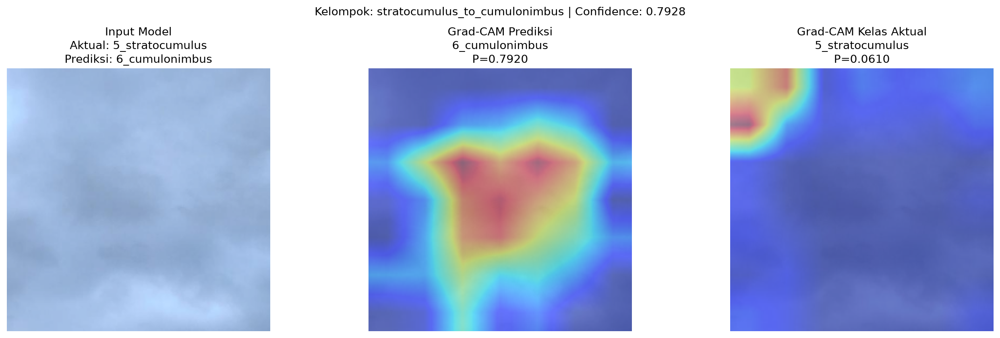

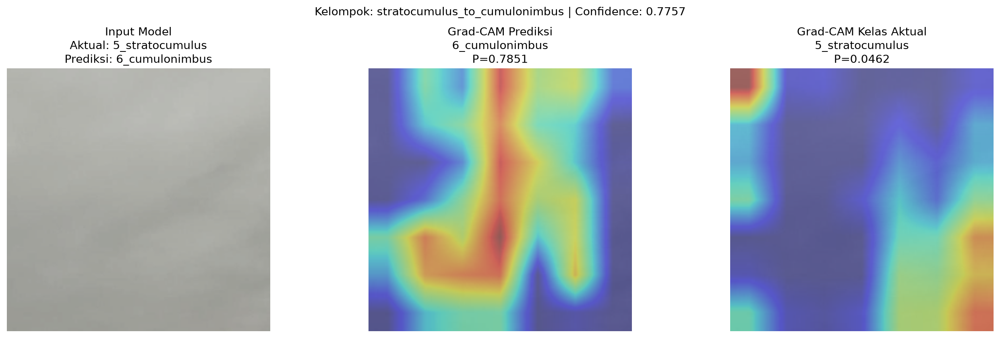

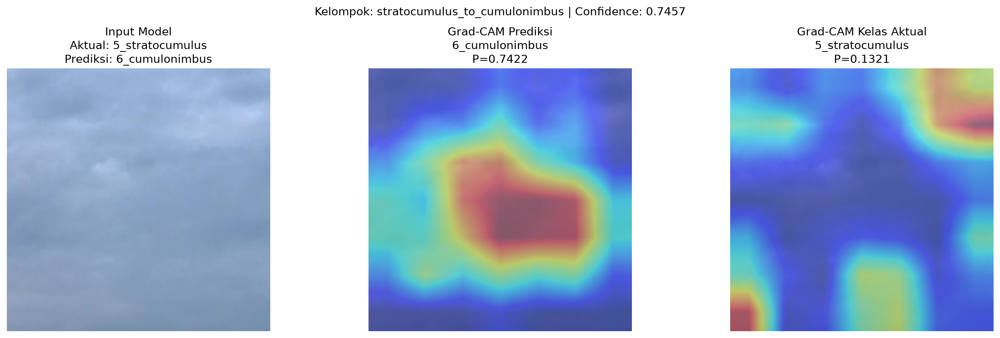

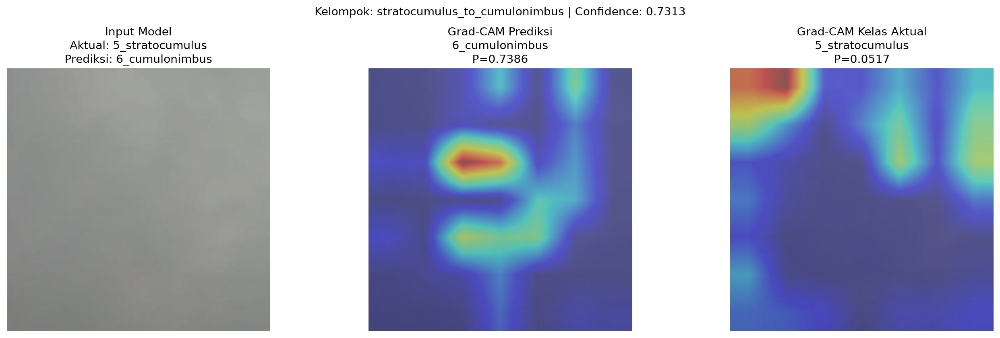

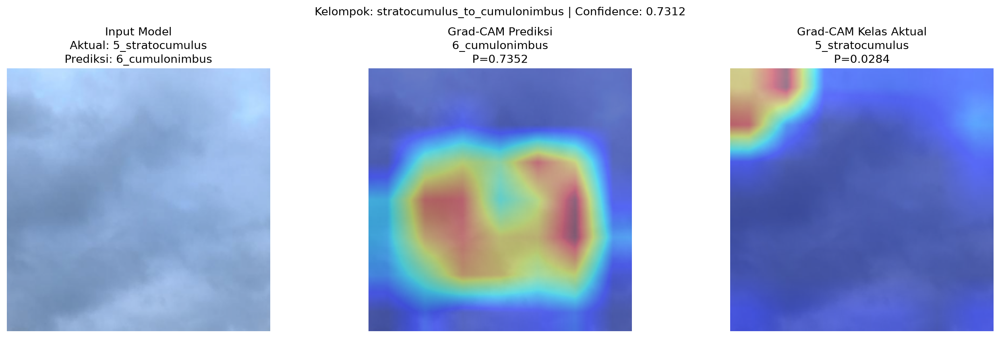

...

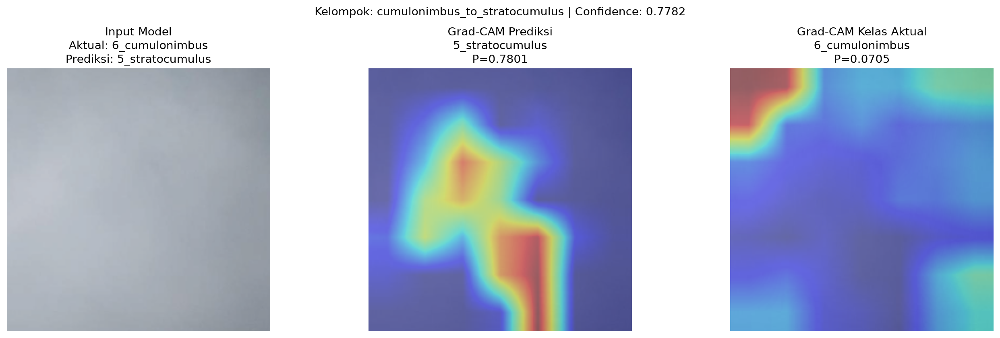

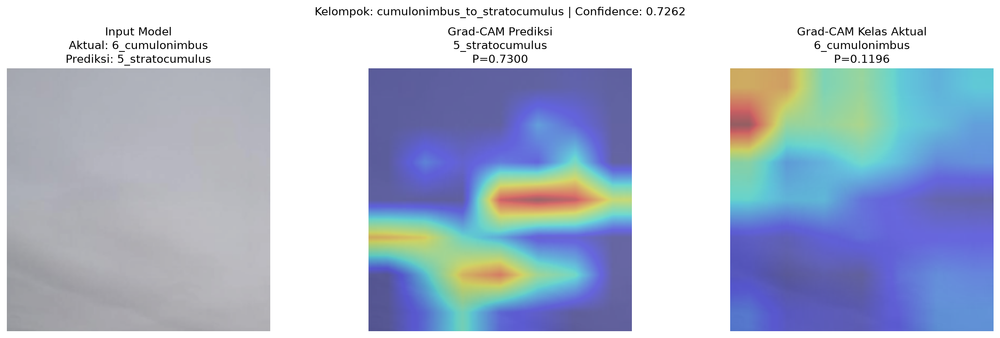

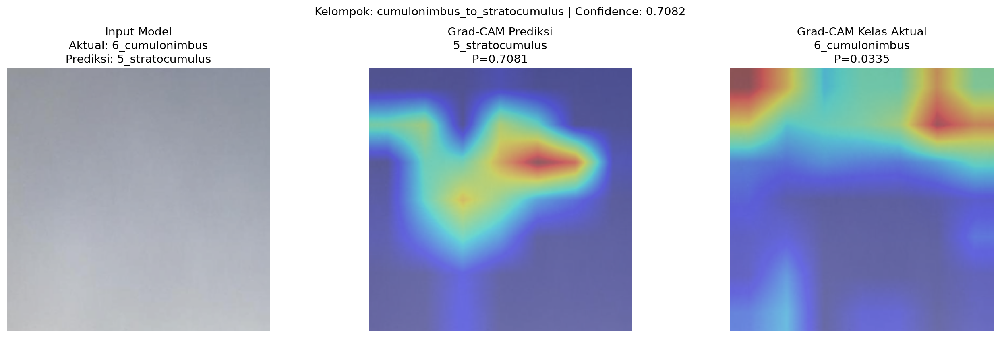

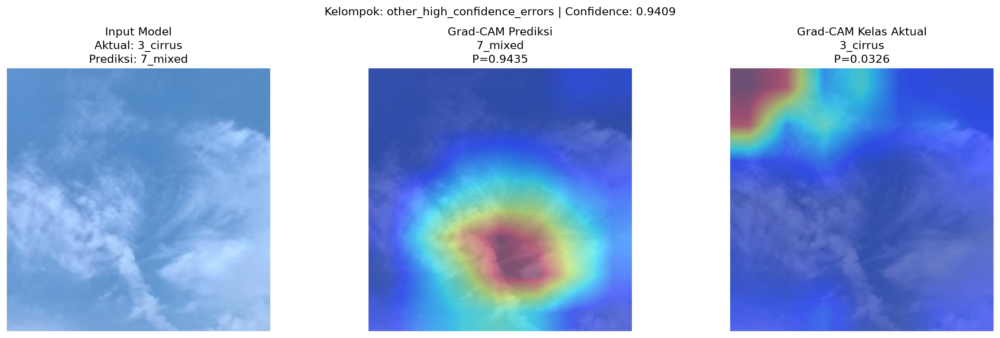

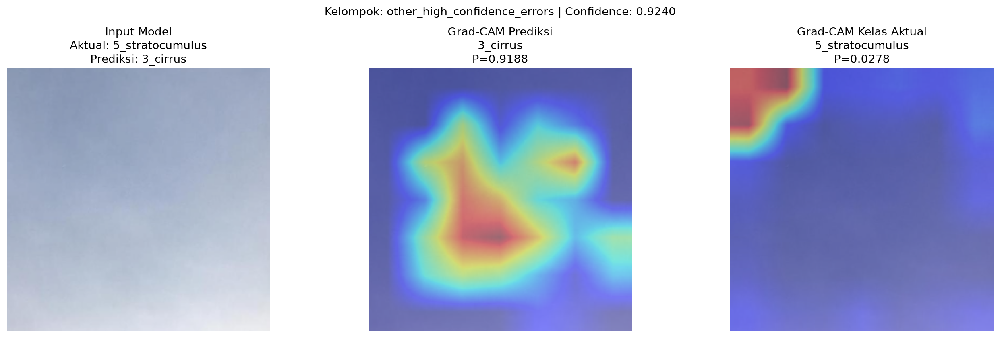

In [60]:
MAX_DISPLAY_IMAGES = 12  # Menentukan jumlah maksimum gambar yang ditampilkan.

for figure_path_text in gradcam_manifest_df["gradcam_figure_path"].head(MAX_DISPLAY_IMAGES):  # Mengiterasi gambar terpilih.
    figure_path = PROJECT_DIR / figure_path_text  # Membentuk path absolut gambar.
    display(Image.open(figure_path))  # Menampilkan gambar Grad-CAM.

## 11. Ringkasan Kuantitatif Area Aktivasi

`predicted_cam_active_ratio` menunjukkan proporsi piksel heatmap prediksi yang memiliki intensitas minimal 0,60.

Nilai tersebut bukan luas awan dan bukan ukuran kualitas Grad-CAM. Nilai hanya digunakan untuk membandingkan apakah perhatian model relatif terkonsentrasi atau menyebar antarkelompok sampel.

In [61]:
activation_summary_df = gradcam_manifest_df.groupby(  # Mengelompokkan hasil berdasarkan kelompok seleksi.
    "selection_group",  # Menggunakan kelompok sampel.
).agg(  # Menghitung statistik kelompok.
    jumlah=("sample_id", "count"),  # Menghitung jumlah sampel.
    mean_predicted_cam_active_ratio=("predicted_cam_active_ratio", "mean"),  # Menghitung rata-rata area aktif prediksi.
    std_predicted_cam_active_ratio=("predicted_cam_active_ratio", "std"),  # Menghitung standard deviation area prediksi.
    mean_true_cam_active_ratio=("true_cam_active_ratio", "mean"),  # Menghitung rata-rata area aktif aktual.
    mean_predicted_probability=("recomputed_predicted_probability", "mean"),  # Menghitung rata-rata probabilitas prediksi.
    mean_true_probability=("true_class_probability", "mean"),  # Menghitung rata-rata probabilitas aktual.
).reset_index()  # Mengubah indeks menjadi kolom.

display(activation_summary_df.round(4))  # Menampilkan ringkasan aktivitas.

,selection_group,jumlah,mean_predicted_cam_active_ratio,std_predicted_cam_active_ratio,mean_true_cam_active_ratio,mean_predicted_probability,mean_true_probability
0,correct_high_confidence_controls,7,0.1270,0.0742,0.1270,0.9532,0.9532
1,cumulonimbus_to_stratocumulus,5,0.0828,0.0350,0.0812,0.7642,0.0649
2,other_high_confidence_errors,5,0.1001,0.0550,0.0499,0.8401,0.0351
3,stratocumulus_to_cumulonimbus,5,0.1867,0.0944,0.0683,0.7586,0.0639


## 12. Menyimpan Ringkasan Grad-CAM

Ringkasan mencatat checkpoint, target layer, metode pemilihan sampel, jumlah gambar, dan status penggunaan test set.

Hasil Grad-CAM tidak mengubah model dan tidak digunakan untuk mengganti checkpoint dalam eksperimen yang sama.

In [62]:
gradcam_summary = {  # Membentuk ringkasan Grad-CAM.
    "created_at": datetime.now().astimezone().isoformat(timespec="seconds"),  # Menyimpan waktu analisis.
    "run_id": RUN_ID,  # Menyimpan identitas analisis.
    "stage": "10c_analisis_gradcam_reference_tl",  # Menyimpan nama tahap.
    "model_name": MODEL_NAME,  # Menyimpan nama model.
    "checkpoint": str(BEST_CHECKPOINT_PATH.relative_to(PROJECT_DIR)),  # Menyimpan checkpoint.
    "checkpoint_epoch": checkpoint.get("global_epoch"),  # Menyimpan epoch checkpoint.
    "validation_summary": str(VALIDATION_SUMMARY_PATH.relative_to(PROJECT_DIR)),  # Menyimpan ringkasan validation.
    "predictions_source": str(PREDICTIONS_PATH.relative_to(PROJECT_DIR)),  # Menyimpan CSV sumber.
    "target_layer": TARGET_LAYER_NAME,  # Menyimpan target layer.
    "selection": {  # Menyimpan metode pemilihan.
        "samples_per_error_group": SAMPLES_PER_ERROR_GROUP,  # Menyimpan jumlah sampel kelompok.
        "groups": selection_summary.to_dict(orient="records"),  # Menyimpan kelompok.
    },  # Menutup konfigurasi pemilihan.
    "generated_images": int(len(gradcam_manifest_df)),  # Menyimpan jumlah gambar.
    "model_parameters_updated": False,  # Menandai parameter tidak diubah.
    "test_data_used": False,  # Menandai test set tidak digunakan.
    "output_artifacts": {  # Menyimpan lokasi output.
        "selected_samples": str(SELECTED_SAMPLES_PATH.relative_to(PROJECT_DIR)),  # Menyimpan daftar sampel.
        "manifest": str(GRADCAM_MANIFEST_PATH.relative_to(PROJECT_DIR)),  # Menyimpan manifest.
        "images_directory": str(GRADCAM_IMAGES_DIR.relative_to(PROJECT_DIR)),  # Menyimpan folder gambar.
    },  # Menutup daftar output.
}  # Menutup ringkasan.

with GRADCAM_SUMMARY_PATH.open("w", encoding="utf-8") as file:  # Membuka file ringkasan.
    json.dump(gradcam_summary, file, indent=2, ensure_ascii=False)  # Menyimpan ringkasan JSON.

print(f"Ringkasan Grad-CAM: {GRADCAM_SUMMARY_PATH.relative_to(PROJECT_DIR)}")  # Menampilkan lokasi ringkasan.

Ringkasan Grad-CAM: logs\resnet50_reference_tl_gradcam_validation_20260828_192812\gradcam_summary.json


## 13. Pemeriksaan Akhir

Pemeriksaan akhir memastikan:

- seluruh citra terpilih menghasilkan Grad-CAM;
- seluruh file gambar tersedia;
- heatmap memiliki rasio aktivitas yang valid;
- checkpoint tidak diubah;
- test set tidak digunakan.

In [63]:
generated_figure_paths = [PROJECT_DIR / path for path in gradcam_manifest_df["gradcam_figure_path"]]  # Membentuk path seluruh gambar.

final_checks = {  # Membentuk daftar pemeriksaan.
    "Sampel Grad-CAM tersedia": len(selected_samples_df) > 0,  # Memeriksa sampel terpilih.
    "Seluruh sampel menghasilkan gambar": len(gradcam_manifest_df) == len(selected_samples_df),  # Memeriksa jumlah hasil.
    "Seluruh gambar tersedia": all(path.is_file() for path in generated_figure_paths),  # Memeriksa file gambar.
    "Rasio area prediksi valid": gradcam_manifest_df["predicted_cam_active_ratio"].between(0.0, 1.0).all(),  # Memeriksa rasio prediksi.
    "Rasio area aktual valid": gradcam_manifest_df["true_cam_active_ratio"].between(0.0, 1.0).all(),  # Memeriksa rasio aktual.
    "Manifest tersedia": GRADCAM_MANIFEST_PATH.is_file(),  # Memeriksa manifest.
    "Ringkasan tersedia": GRADCAM_SUMMARY_PATH.is_file(),  # Memeriksa ringkasan.
    "Parameter model tidak diubah": gradcam_summary["model_parameters_updated"] is False,  # Memeriksa perubahan model.
    "Test set tidak digunakan": gradcam_summary["test_data_used"] is False,  # Memeriksa penggunaan test.
}  # Menutup pemeriksaan.

final_check_table = pd.DataFrame({  # Membentuk tabel pemeriksaan.
    "Pemeriksaan": list(final_checks.keys()),  # Memasukkan nama pemeriksaan.
    "Status": ["Berhasil" if status else "Gagal" for status in final_checks.values()],  # Mengubah status Boolean.
})  # Menutup tabel.

display(final_check_table)  # Menampilkan pemeriksaan.

failed_checks = [name for name, status in final_checks.items() if not status]  # Mengambil pemeriksaan gagal.

if failed_checks:  # Memeriksa kegagalan.
    failed_text = "\n".join(f"- {name}" for name in failed_checks)  # Menyusun daftar kegagalan.
    raise AssertionError(f"Pemeriksaan Grad-CAM gagal:\n{failed_text}")  # Menghentikan proses jika gagal.

print("=" * 76)  # Menampilkan garis pembatas.
print("ANALISIS GRAD-CAM SELESAI")  # Menampilkan status penyelesaian.
print("=" * 76)  # Menampilkan garis pembatas.
print(f"Model                    : {MODEL_NAME}")  # Menampilkan model.
print(f"Checkpoint epoch         : {checkpoint.get('global_epoch')}")  # Menampilkan epoch.
print(f"Target layer             : {TARGET_LAYER_NAME}")  # Menampilkan target layer.
print(f"Jumlah visualisasi       : {len(gradcam_manifest_df)}")  # Menampilkan jumlah visualisasi.
print(f"Kesalahan utama          : 5_stratocumulus ↔ 6_cumulonimbus")  # Menampilkan fokus kesalahan.
print("Parameter model berubah  : Tidak")  # Menampilkan status model.
print("Test set digunakan       : Tidak")  # Menampilkan status test.
print(f"Folder hasil             : {RUN_LOG_DIR.relative_to(PROJECT_DIR)}")  # Menampilkan folder hasil.
print("=" * 76)  # Menampilkan garis penutup.

,Pemeriksaan,Status
0,Sampel Grad-CAM tersedia,Berhasil
1,Seluruh sampel menghasilkan gambar,Berhasil
2,Seluruh gambar tersedia,Berhasil
3,Rasio area prediksi valid,Berhasil
4,Rasio area aktual valid,Berhasil
5,Manifest tersedia,Berhasil
6,Ringkasan tersedia,Berhasil
7,Parameter model tidak diubah,Berhasil
8,Test set tidak digunakan,Berhasil


ANALISIS GRAD-CAM SELESAI
Model                    : resnet50
Checkpoint epoch         : 21
Target layer             : layer4[-1].conv3 
Jumlah visualisasi       : 22
Kesalahan utama          : 5_stratocumulus ↔ 6_cumulonimbus
Parameter model berubah  : Tidak
Test set digunakan       : Tidak
Folder hasil             : logs\resnet50_reference_tl_gradcam_validation_20260828_192812


## Kesimpulan

Grad-CAM digunakan untuk memeriksa apakah model memusatkan perhatian pada wilayah awan yang relevan ketika membedakan tujuh kelas GCD.

Analisis utama diarahkan pada pertukaran:

```text
5_stratocumulus ↔ 6_cumulonimbus